In [1]:
import pandas as pd

from sodapy import Socrata

import geopandas as gpd

import contextily as ctx

import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

import matplotlib.pyplot as plt
import plotly.express as px

# Census Block Cleaning and Mapping 

We are using parks data and LA census block data so we'll bring in the census block data first

In [2]:
gdf = gpd.read_file('Data/acs2018_5yr_B01003_15000US060372711003.geojson')

In [3]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2516 entries, 0 to 2515
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             2516 non-null   object  
 1   name              2516 non-null   object  
 2   B01003001         2516 non-null   float64 
 3   B01003001, Error  2516 non-null   float64 
 4   geometry          2516 non-null   geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 98.4+ KB


In [4]:
gdf = gdf[['geoid','B01003001','geometry']]
gdf.columns = ['FIPS','TotalPop','geometry']

In [5]:
gdf.tail()

,FIPS,TotalPop,geometry
2511,15000US060379800261,37.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,15000US060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,15000US060379800311,1113.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,15000US060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2515,16000US0644000,3959657.0,"MULTIPOLYGON (((-118.66818 34.18987, -118.6681..."


The last row has the total population for the city of LA so we want to drop that

In [6]:
gdf=gdf.drop(2515)

In [7]:
gdf['FIPS'] = gdf['FIPS'].str.replace('15000US','')
gdf.tail()

,FIPS,TotalPop,geometry
2510,060379800241,264.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
2511,060379800261,37.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,060379800311,1113.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


In [8]:
gdf.sort_values(by='TotalPop').head(20)

,FIPS,TotalPop,geometry
2514,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2506,060379800201,0.0,"MULTIPOLYGON (((-118.34412 34.21700, -118.3438..."
2358,060372772002,0.0,"MULTIPOLYGON (((-118.38597 33.94734, -118.3859..."
2512,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2509,060379800231,0.0,"MULTIPOLYGON (((-118.64870 34.23120, -118.6480..."
2508,060379800221,0.0,"MULTIPOLYGON (((-118.50266 34.30809, -118.5026..."
2501,060379800091,5.0,"MULTIPOLYGON (((-118.33707 34.14160, -118.3361..."
2503,060379800141,10.0,"MULTIPOLYGON (((-118.26088 33.76850, -118.2602..."
2507,060379800211,12.0,"MULTIPOLYGON (((-118.40183 34.26509, -118.4017..."
2511,060379800261,37.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."


To cut down the number of census tracts we're looking at we will only look at those with a population greater than 100

In [9]:
gdf = gdf[gdf['TotalPop']>100]

In [10]:
gdf = gdf.to_crs(epsg=3857)

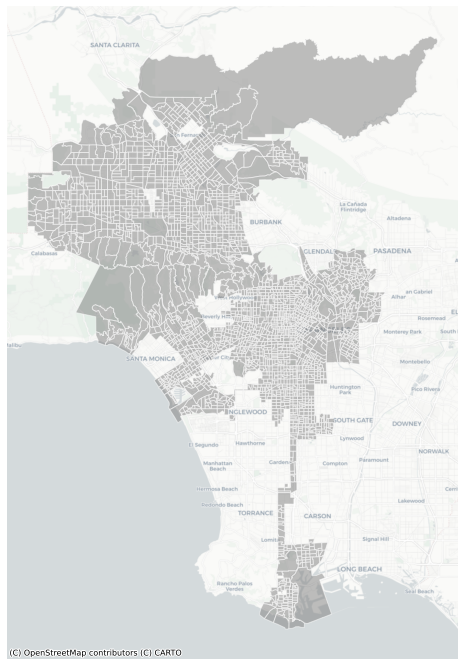

In [11]:
ax=gdf.plot(figsize=(12,12),
                      color='gray', 
                      edgecolor='white',
                      alpha=0.5)

ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# Park data cleaning and visualization

There is our basemap of the census blocks in the city of Los Angeles, now we're going to bring in the parks data we have been working with from the city 

In [12]:
client = Socrata("data.lacity.org", None)

results = client.get("ax8j-dhzm", 
                     limit=5000,)

df = pd.DataFrame.from_records(results)

df.head()

,locationtype,location_name,stnumber,stname,stsuffix,city,state,zip,website,phone,...,:@computed_region_tatf_ua23,:@computed_region_2dna_qi2s,stdirection,addresstype,addresstypevalue,:@computed_region_ur2y_g4cx,crossstname,stnumberfraction,crossstsuffix,stsuffixdirection
0,Beaches,Venice Beach,1800,Ocean Front,Walk,"{'latitude': '33.985', 'longitude': '-118.474'...",CA,90291,http://www.laparks.org/dos/reccenter/facility/...,(310) 399-2775,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Beaches,Cabrillo Beach,3720,Stephen M. White,Dr,"{'latitude': '33.7112', 'longitude': '-118.283...",CA,90731,http://www.laparks.org/dos/aquatic/facility/ca...,(310) 548-7554,...,793,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Camps,Griffith Park Boys Camp,4730,Crystal Springs,Dr,"{'latitude': '34.139', 'longitude': '-118.298'...",CA,90027,http://www.laparks.org/dos/camps/griffith.htm,(323) 664-0571,...,1325,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Camps,Otis Wallace Children's Campground,11770,Foothill,Blvd,"{'latitude': '34.2657', 'longitude': '-118.396...",CA,91342,NaN,(818) 756-8060,...,248,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Camps,Griffith Park - Hollywoodland Girls Camp,3200,Canyon,Dr,"{'latitude': '34.1255', 'longitude': '-118.314...",CA,90068,http://www.laparks.org/dos/camps/hollywoodland...,(323) 467-7193,...,543,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
df.geolong = df.geolong.astype('float')
df.geolat = df.geolat.astype('float')
df.geolong.describe()

count    986.000000
mean    -118.108705
std        7.547418
min     -118.668691
25%     -118.439137
50%     -118.313975
75%     -118.264562
max      118.614495
Name: geolong, dtype: float64

We know this data has an error in one of the logitude cells, so we need to change it from positive to negative

In [14]:
df.loc[250].geolong
df.at[250,'geolong'] = -df.loc[250].geolong

In [15]:
df.geolong[df.geolong>0]

Series([], Name: geolong, dtype: float64)

In [16]:
df.geolong = df.geolong.astype('float')
df.geolat = df.geolat.astype('float')
df.geolong.describe()

count    986.000000
mean    -118.349302
std        0.120760
min     -118.668691
25%     -118.439294
50%     -118.314186
75%     -118.264784
max     -117.302884
Name: geolong, dtype: float64

In [19]:
parks = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.geolong, df.geolat))

In [20]:
parks.shape

(986, 27)

Now we convert the data from pandas to a geodataframe

In [21]:
parks = gpd.GeoDataFrame(parks, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy (df.geolong, df.geolat))

In [22]:
parks = parks.to_crs(epsg=3857)

In [23]:
parks.geolong = parks.geolong.astype('float')
parks.geolat = parks.geolat.astype('float')

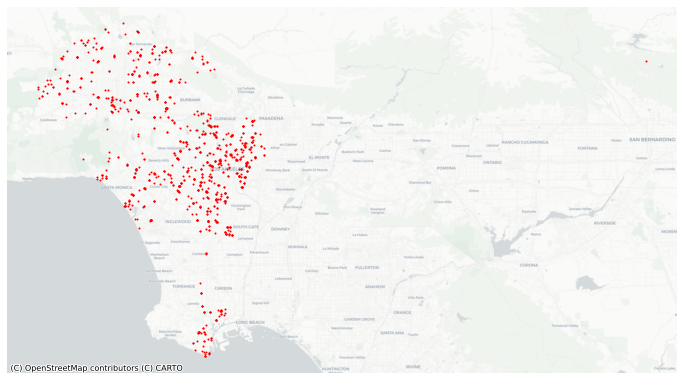

In [24]:
ax = parks.plot(figsize=(12,12),
                  color='red',
                  markersize=1)

ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

There is an outllier in the data outside of the city of LA which we will get rid of 

In [25]:
parks[parks.geolong>-117.4]

,locationtype,location_name,stnumber,stname,stsuffix,city,state,zip,website,phone,...,:@computed_region_2dna_qi2s,stdirection,addresstype,addresstypevalue,:@computed_region_ur2y_g4cx,crossstname,stnumberfraction,crossstsuffix,stsuffixdirection,geometry
5,Camps,Camp Seely,250,Highway 138,NaN,"{'latitude': '34.2539', 'longitude': '-117.303...",CA,92325,http://www.laparks.org/dos/camps/seely.htm,(213) 485-4853,...,NaN,N,PO Box,3372,NaN,NaN,NaN,NaN,NaN,POINT (-13058097.315 4062941.179)


In [26]:
parks.drop(parks[parks.geolong>-117.4].index,inplace=True)

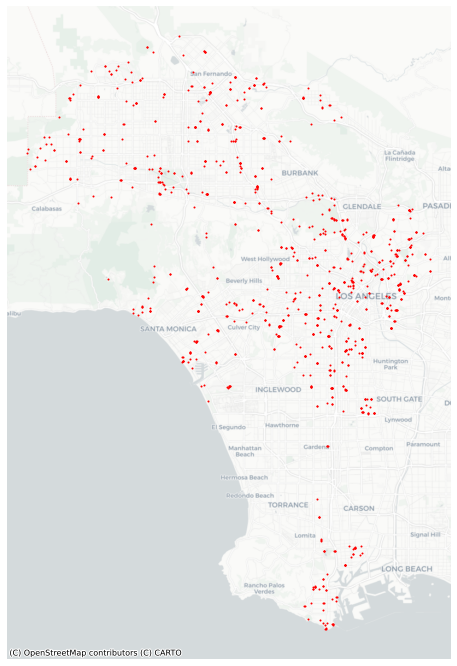

In [27]:
ax = parks.plot(figsize=(12,12),
                  color='red',
                  markersize=1)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now the outlier is removed so we'll keep going and make a multilayer map

# Multi-layer mapping and spatial join

In [28]:
minx, miny, maxx, maxy = parks.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13210138.255224325
-13153686.249011712
3989329.3007376445
4072434.397452983


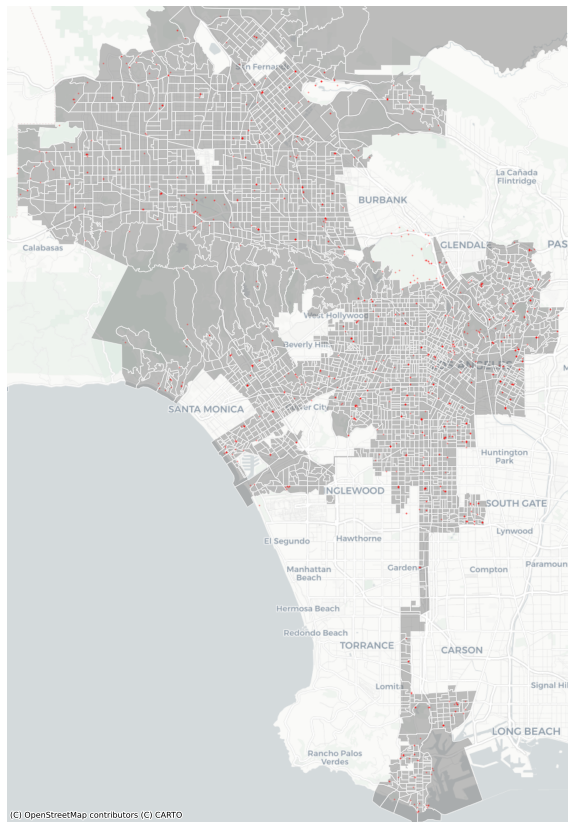

In [29]:
fig, ax = plt.subplots(figsize=(15, 15))

gdf.plot(ax=ax, 
        color='gray', 
        edgecolor='white',
        alpha=0.5)

parks.plot(ax=ax, 
            color='red',
            markersize=1,
            alpha=0.2)

ax.set_xlim(minx - 1000, maxx + 1000) 
ax.set_ylim(miny - 1000, maxy + 1000)

ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now we'll do a spatial join

In [30]:
join = gpd.sjoin(gdf, parks, how='right')
join.head()

,index_left,FIPS,TotalPop,locationtype,location_name,stnumber,stname,stsuffix,city,state,...,:@computed_region_2dna_qi2s,stdirection,addresstype,addresstypevalue,:@computed_region_ur2y_g4cx,crossstname,stnumberfraction,crossstsuffix,stsuffixdirection,geometry
355,1.0,060371011102,1529.0,Parks,Howard Finn Park & Community Garden,7747,Foothill,Blvd,"{'latitude': '34.2579', 'longitude': '-118.301...",CA,...,7,NaN,NaN,NaN,18,NaN,NaN,NaN,NaN,POINT (-13169175.911 4063488.799)
846,2.0,060371011103,979.0,Swimming Pools - Summer,Verdugo Hills Pool,10654,Irma,Ave,"{'latitude': '34.263', 'longitude': '-118.301'...",CA,...,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-13169173.718 4064167.341)
79,5.0,060371012101,2909.0,Museums,Bolton Hall Historical Museum,10110,Commerce,Ave,"{'latitude': '34.2526', 'longitude': '-118.288...",CA,...,7,NaN,NaN,NaN,18,NaN,NaN,NaN,NaN,POINT (-13167790.095 4062771.350)
484,5.0,060371012101,2909.0,Parks,Little Landers Park,10116,Commerce,Ave,"{'latitude': '34.2527', 'longitude': '-118.288...",CA,...,7,N,NaN,NaN,18,NaN,NaN,NaN,NaN,POINT (-13167813.360 4062781.450)
200,13.0,060371014001,939.0,Parks,Mcgroarty Cultural Art Center,7570,Mcgroarty,Ter,"{'latitude': '34.2509', 'longitude': '-118.297...",CA,...,7,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,POINT (-13168806.219 4062538.495)


In [31]:
parks_by_gdf = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='parks_count')

Now we can look at park data by FIPS code

In [32]:
parks_by_gdf.head()

,FIPS,parks_count
0,060379800241,19
1,060372197003,12
2,060379800101,11
3,060371252002,10
4,060371991202,9


We'll take a look at the top 20 geographies by park count

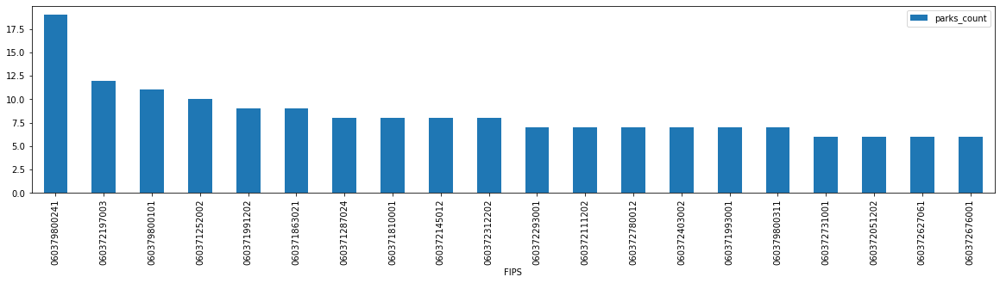

In [33]:
parks_by_gdf[:20].plot.bar(figsize=(20,4),
                             x='FIPS',
                             y='parks_count')

We want to visualize this data to make sense of it, so we'll map it

In [34]:
gdf=gdf.merge(parks_by_gdf,on='FIPS')

In [35]:
gdf.head()

,FIPS,TotalPop,geometry,parks_count
0,060371011102,1529.0,"MULTIPOLYGON (((-13169350.794 4063591.834, -13...",1
1,060371011103,979.0,"MULTIPOLYGON (((-13169185.150 4064208.314, -13...",1
2,060371012101,2909.0,"MULTIPOLYGON (((-13168465.581 4062734.852, -13...",2
3,060371014001,939.0,"MULTIPOLYGON (((-13169389.644 4062858.621, -13...",1
4,060371014002,1540.0,"MULTIPOLYGON (((-13171587.314 4062370.826, -13...",3


We'll normalize the data by the number of people who live in a census group block; roughly 1000

In [36]:
gdf['parks_per_1000'] = gdf['parks_count']/gdf['TotalPop']*1000

In [37]:
gdf.sort_values(by="parks_per_1000").tail()

,FIPS,TotalPop,geometry,parks_count,parks_per_1000
374,060379800151,556.0,"MULTIPOLYGON (((-13170262.055 3997538.878, -13...",6,10.791367
375,060379800191,151.0,"MULTIPOLYGON (((-13202401.217 4038791.402, -13...",2,13.245033
223,060372145012,441.0,"MULTIPOLYGON (((-13175934.117 4039025.517, -13...",8,18.140590
373,060379800101,189.0,"MULTIPOLYGON (((-13163713.575 4039600.478, -13...",11,58.201058
376,060379800241,264.0,"MULTIPOLYGON (((-13193418.068 4053521.172, -13...",19,71.969697


We'll take a look at the top 20 locations

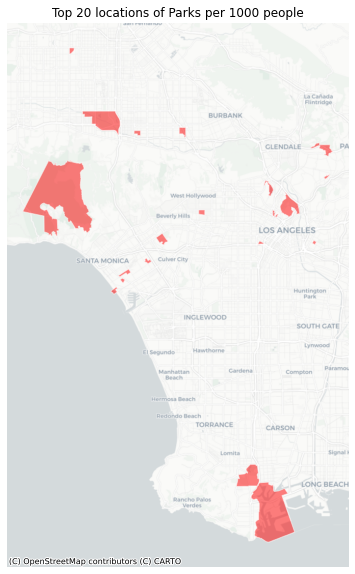

In [38]:
ax = gdf.sort_values(by='parks_per_1000',ascending=False)[:20].plot(figsize=(12,10),
                                                             color='red',
                                                             edgecolor='white',
                                                             alpha=0.5,legend=True)


ax.set_title('Top 20 locations of Parks per 1000 people')

ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now we'll make a chloropleth map of parks 

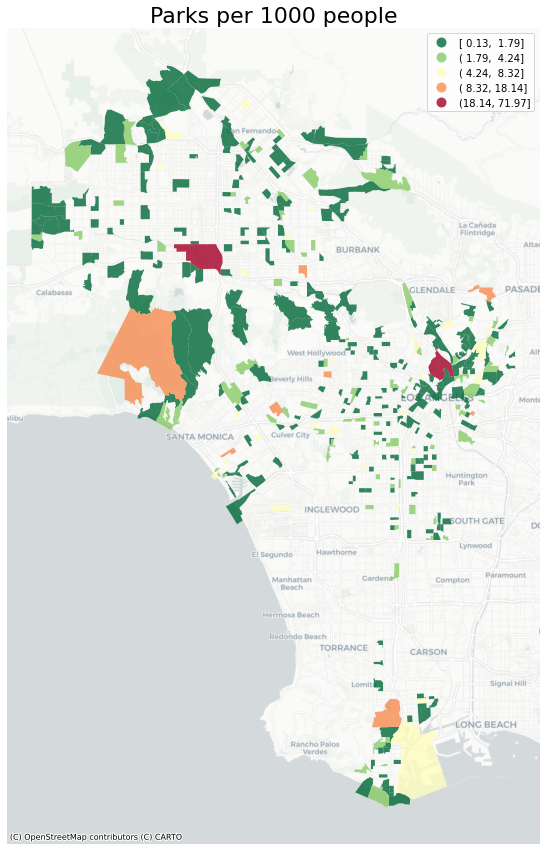

In [39]:
ax = gdf.plot(figsize=(15,15),
                        column='parks_per_1000',
                        legend=True,
                        alpha=0.8,
                        cmap='RdYlGn_r',
                        scheme='naturalbreaks')

ax.axis('off')
ax.set_title('Parks per 1000 people',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

This map is useful to show where the concetration of parks are in the city of LA 

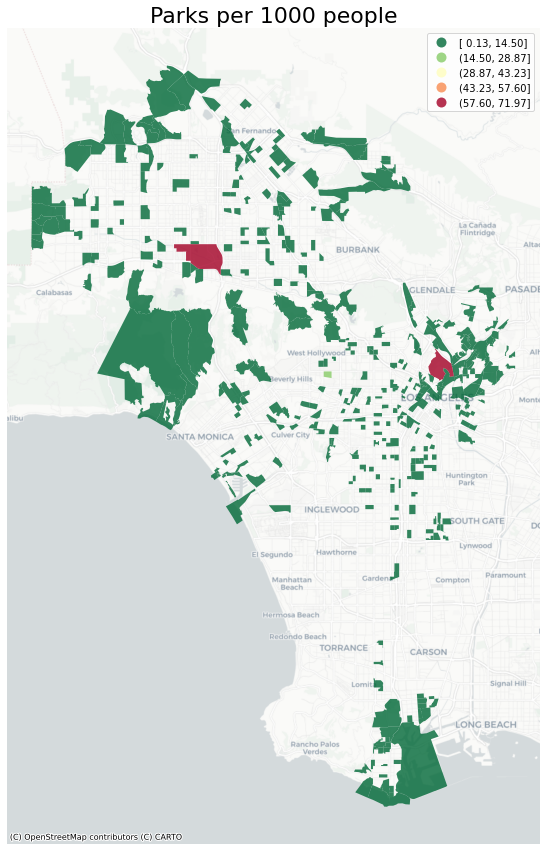

In [40]:
ax = gdf.plot(figsize=(15,15),
                        column='parks_per_1000',
                        legend=True,
                        alpha=0.8,
                        cmap='RdYlGn_r',
                        scheme='equalinterval')

ax.axis('off')
ax.set_title('Parks per 1000 people',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

The natural breaks map is more informative than the equal interval map since the concentration of parks fall in the extreme of the low and high extremes

# Global spatial autocorrelation

Using spatial auto correlation we will shuffle our values and reassign them to different geographies to determine if the current patterns in our maps are a statistically significant autocorrelation

We are going to start by weighting our data using the 8 nearest neighbors to any census block

In [41]:
wq =  lps.weights.KNN.from_dataframe(gdf,k=8)
wq.transform = 'r'

We will create a new column for the spatial lag which is the average of the values of the (8) neighboring census blocks

In [42]:
gdf['parks_per_1000_lag'] = lps.weights.lag_spatial(wq, gdf['parks_per_1000'])

In [43]:
gdf.sort_values(by='parks_per_1000',ascending=False).sample(10)

,FIPS,TotalPop,geometry,parks_count,parks_per_1000,parks_per_1000_lag
287,060372395022,1155.0,"MULTIPOLYGON (((-13165704.301 4024950.982, -13...",1,0.865801,2.369119
170,060371992012,2277.0,"MULTIPOLYGON (((-13159712.084 4039066.374, -13...",1,0.439174,2.036457
133,060371852022,1235.0,"MULTIPOLYGON (((-13159924.593 4041963.258, -13...",1,0.809717,1.205038
207,060372080003,1233.0,"MULTIPOLYGON (((-13164671.368 4037616.462, -13...",1,0.811030,1.868716
268,060372325002,883.0,"MULTIPOLYGON (((-13170636.311 4027586.897, -13...",1,1.132503,1.701454
206,060372080002,3292.0,"MULTIPOLYGON (((-13164738.716 4037954.968, -13...",1,0.303767,1.932124
139,060371864012,932.0,"MULTIPOLYGON (((-13163982.523 4044777.645, -13...",1,1.072961,2.504000
159,060371927001,2951.0,"MULTIPOLYGON (((-13168172.922 4040031.382, -13...",1,0.338868,1.584008
203,060372074001,1384.0,"MULTIPOLYGON (((-13163883.226 4036698.552, -13...",1,0.722543,0.703892
105,060371374012,1298.0,"MULTIPOLYGON (((-13204090.267 4048908.998, -13...",1,0.770416,0.877857


Using the spatial lag will take into account neighboring census tracts so neighborhoods closer to Boyle Heights (our neighborhood with the highest park count) will be impacted by this high park count even if they have a low park count. Which for real life purposes if useful because if you live close to a neighborhood with a lot of parks but are not in a census tract defined to be a part of that neighborhoods, you still get the benefits of the parks.

In [44]:
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

# Spatial lag map

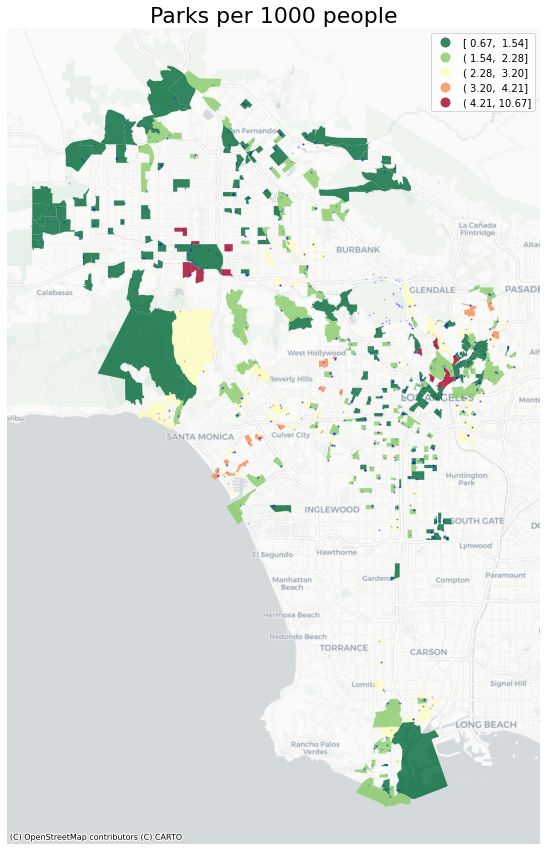

In [45]:
fig, ax = plt.subplots(figsize=(15, 15))

gdf.plot(ax=ax,
         figsize=(15,15),
         column='parks_per_1000_lag',
         legend=True,
         alpha=0.8,
         cmap='RdYlGn_r',
         scheme='naturalbreaks')

parks.plot(ax=ax, 
            color='blue',
             markersize =1,
             alpha=0.2, 
              legend=True)

ax.axis('off')
ax.set_title('Parks per 1000 people',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

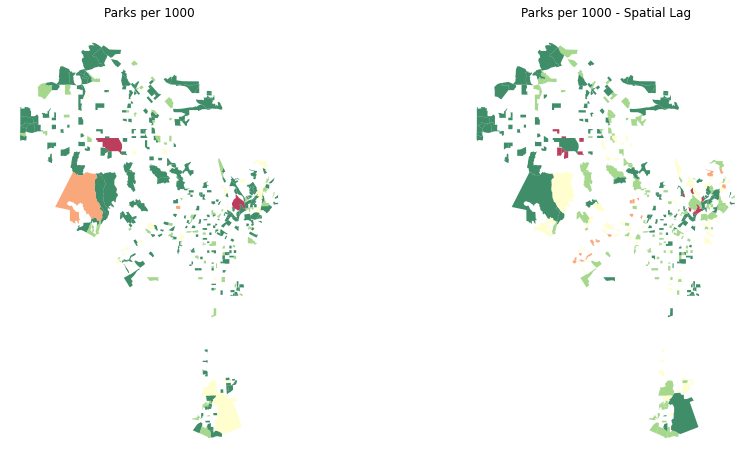

In [46]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

ax1, ax2 = axs

gdf.plot(column='parks_per_1000', 
            cmap='RdYlGn_r', 
            scheme='naturalbreaks',
            k=5, 
            edgecolor='white', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax1 
           )


ax1.axis("off")
ax1.set_title("Parks per 1000")


gdf.plot(column='parks_per_1000_lag', 
            cmap='RdYlGn_r', 
            scheme='naturalbreaks',
            k=5, 
            edgecolor='white', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax2 
           )

ax2.axis("off")
ax2.set_title("Parks per 1000 - Spatial Lag")

plt.show()

With this side by side comparison we get a better idea of which areas of Los Angeles have a statistically significant number of park clusters. It is only a few small places which we can see clearly on the spatial lag map. We would have overgeneralized the importance of the park clusters if we only used the map on the left.

# Interactive spatial lag sattelite map

In [47]:
gdf_web = gdf.to_crs('EPSG:4326')

In [48]:
minx, miny, maxx, maxy = gdf_web.geometry.total_bounds
center_lat_gdf_web = (maxy-miny)/2+miny
center_lon_gdf_web = (maxx-minx)/2+minx

In [49]:
gdf_web.parks_per_1000_lag.describe()

count    378.000000
mean       2.130151
std        1.577086
min        0.667459
25%        1.356606
50%        1.766199
75%        2.357309
max       10.670216
Name: parks_per_1000_lag, dtype: float64

In [50]:
median = gdf_web.parks_per_1000_lag.median()

In [51]:
fig = px.choropleth_mapbox(gdf_web, 
                     geojson=gdf_web.geometry, 
                     locations=gdf_web.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='parks_per_1000_lag',
                     color_continuous_scale='RdYlGn_r',
                     color_continuous_midpoint =median,
                     range_color =(0,median*2),
                     hover_data=['parks_count','parks_per_1000','parks_per_1000_lag'],
                     center = {"lat": center_lat_gdf_web, "lon": center_lon_gdf_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'parks_per_1000_lag':'Parks per 1000 (Spatial Lag)',
                             'parks_per_1000':'Parks per 1000',
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Moran's Plot

Now that we have maps showing clearer clusters we want to quantify the degree of the spatial correlations we are seeing

In [52]:
y = gdf.parks_per_1000
moran = Moran(y, wq)
moran.I

-0.011602156087687237

We got a negative Moran's I meaning that similar values are not close to each other. We have high values next to low values and low values next to high values

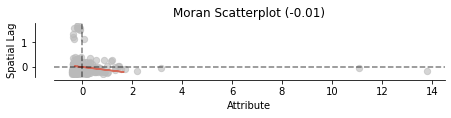

In [53]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

In order to know if this -0.01 value is statistically significant we need to run a simulation and compare our number to the reference distribution

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.



(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f9c111e79a0>)

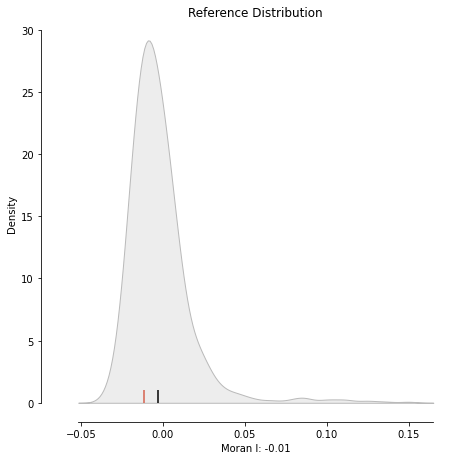

In [54]:
plot_moran_simulation(moran,aspect_equal=False)

As we can see our moran's I value falls within the reference simulations

In [55]:
moran.p_sim

0.311

We do not have a very low p value meaning that our map has a higher chance of being randomly correlated. Making our moran's I not statistically significant

# Local spatial autocorrelation

We know we have a negative spatial autocorrelation (although not statistically significant) but we don't know where our clusters are. We'll use local spatial autocorrelation to group our data into high values near to high values (HH), Low values with nearby low values (LL), Low values with high values in its neighborhood, and high values with low values

In [56]:
lisa = esda.moran.Moran_Local(y, wq)

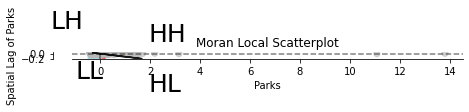

In [57]:
fig, ax = moran_scatterplot(lisa, p=0.05)
ax.set_xlabel("Parks")
ax.set_ylabel('Spatial Lag of Parks')
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1.5, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

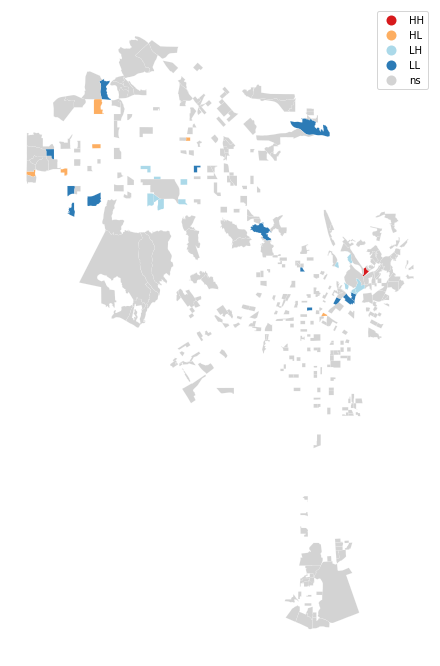

In [58]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, gdf, p=0.05, ax=ax)
plt.show()

Now we can see the few spatial clusters where we have statistically significant clusters. 

We'll compare to another map with the p value of 0.01 to see more statistically significant spatial autocorrelations

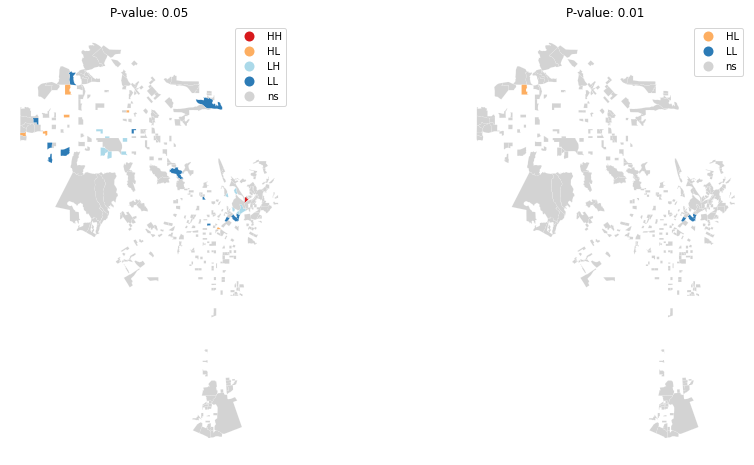

In [59]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

ax1, ax2 = axs

lisa_cluster(lisa, gdf, p=0.05, ax=ax1)

ax1.axis("off")
ax1.set_title("P-value: 0.05")

lisa_cluster(lisa, gdf, p=0.01, ax=ax2)
ax2.axis("off")
ax2.set_title("P-value: 0.01")

plt.show()

It looks like only two clusters are significantly spatially autocorrelated at a p value of 0.01

# Interactive Lisa map

In [60]:
lisa.y[:5]

array([0.65402224, 1.02145046, 0.68752149, 1.06496273, 1.94805195])

In [61]:
lisa.q[:5]

array([3, 3, 3, 3, 3])

In [62]:
lisa.p_sim[:5]

array([0.127, 0.108, 0.124, 0.104, 0.024])

In [63]:
gdf['q'] = lisa.q.tolist()

In [64]:
gdf['p_sim'] = lisa.p_sim.tolist()

In [65]:
gdf.head()

,FIPS,TotalPop,geometry,parks_count,parks_per_1000,parks_per_1000_lag,q,p_sim
0,060371011102,1529.0,"MULTIPOLYGON (((-13169350.794 4063591.834, -13...",1,0.654022,1.150454,3,0.127
1,060371011103,979.0,"MULTIPOLYGON (((-13169185.150 4064208.314, -13...",1,1.021450,1.104526,3,0.108
2,060371012101,2909.0,"MULTIPOLYGON (((-13168465.581 4062734.852, -13...",2,0.687521,1.146267,3,0.124
3,060371014001,939.0,"MULTIPOLYGON (((-13169389.644 4062858.621, -13...",1,1.064963,1.099087,3,0.104
4,060371014002,1540.0,"MULTIPOLYGON (((-13171587.314 4062370.826, -13...",3,1.948052,0.871786,3,0.024


Now we can map hotspots, coldspots, donuts, and diamonds. We'll map a hot spot

# Hotspot map

In [66]:
hot_spots = gdf[(gdf.p_sim < 0.05) & (gdf.q == 1)]

In [67]:
hot_spots.shape

(1, 8)

Only one census block group meets the criteria of a hotspot

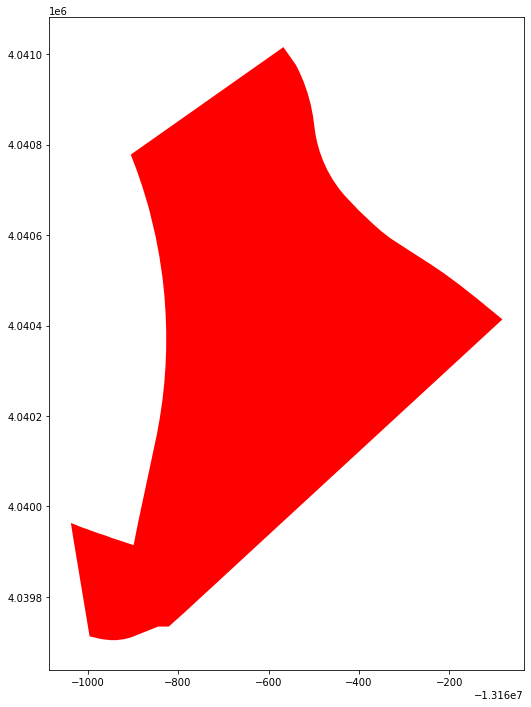

In [68]:
hot_spots.plot(figsize=(12,12),color='red',legend=True,categorical=True)

In [69]:
hot_spots = hot_spots.to_crs('EPSG:4326')

In [70]:
minx, miny, maxx, maxy = hot_spots.geometry.total_bounds
center_lat_hot_spots = (maxy-miny)/2+miny
center_lon_hot_spots = (maxx-minx)/2+minx

In [71]:
fig = px.choropleth_mapbox(hot_spots, 
                     geojson=hot_spots.geometry, 
                     locations=hot_spots.index, 
                     mapbox_style="satellite-streets",
                     center = {"lat": center_lat_hot_spots, "lon": center_lon_hot_spots},
                     zoom=9, 
                     opacity=0.6,
                     color='parks_per_1000_lag',
                     color_continuous_scale='RdYlGn_r',
                     color_continuous_midpoint =median,
                     range_color =(0,median*2),
                     hover_data=['parks_count','parks_per_1000','parks_per_1000_lag'],
                     labels={
                             'parks_per_1000_lag':'Parks per 1000 (Spatial Lag)',
                             'parks_per_1000':'Parks per 1000',
                     })
fig.update_traces(marker_line_width=1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In this notebook we are continuing to explore park data in the city of LA. We have been able to visualize areas of higher park concentration in maps in the past but this spatial autocorrelation exploration allowed us to visualize which areas of our data are statistically significant. There are only a few areas where the spatial autocorrelation is statistically significant. Since park data is pretty static this just allows us to dive deeper into our map interpretations to see where we can make statements about certain neighborhoods having significantly higher park access than others. 

**Group members**: Sasha Ragland and Wendy Miranda. Sasha completed the spatial autocorrelation for park data this week while Wendy complete a point analysis in a separate notebook.